## Exploration with Word Embedings (Deep Learning)
   
### CBOW
#### Model p(word | context)
#### Advantages: Smooths over distribution by averaging over all context words. This is helpful for small training sets.
####                        Also faster
   
<img src="./images/CBOW.png" width="300"> 

### Skipgram 
#### Model p(context | word) 
#### Advantage: Learns finer-grained vectors on large training data (i.e. better with infrequent words)

<tr>
    <td><img src="./images/Skip-Gram.png" alt="Drawing" style="width: 300px;"/></td>
    <td><img src="./images/skip_gram_net_arch.png" alt="Drawing" style="width: 500px;"/></td>
</tr>
    

## Environment Setup

#### First we will import some Python packages that we will use.

In [1]:
import re
import time
import numpy as np
import pandas as pd
import pickle as pkl
import nltk
from nltk.tokenize import sent_tokenize
from nltk.corpus import stopwords
import gensim
from gensim.models import Word2Vec
from gensim.models import Phrases
from gensim.models.phrases import Phraser
import sklearn
from sklearn.manifold import TSNE
%matplotlib inline 
import matplotlib.pyplot as plt

D:\anaconda3\lib\site-packages\gensim\utils.py:1209: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")


## More Environment Setup

#### We also need to load some nltk resources. These resources will help us clean the data.

In [2]:
# Text contains a lot of noisy words that are simply there to help with fluency.
nltk.download("stopwords")

# PUNKT is a tokenizer so that we can work with words and identify sentence boundaries.
nltk.download("punkt")

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\jferraro\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\jferraro\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

## Syntactic NLP Processing

#### We want to coustomize tokenization so we have more control over our text and can remove unique textual forms of noise like dates, ages, etc.


In [3]:
def tokenize(text):
    sentence_list = [[sentence] for sentence in nltk.sent_tokenize(text)]
    tokenized_sentence_list = [nltk.word_tokenize(tokens) for sentence in sentence_list for tokens in sentence]
    filtered_sentence_list = []
    for tokenized_sentence in tokenized_sentence_list:
        filtered_sentence = []
        for token in tokenized_sentence:
            if (re.search('(^[a-zA-Z]+$)', token)):
                filtered_sentence.append(token)
        if filtered_sentence:
            filtered_sentence_list.append(filtered_sentence)        
    return filtered_sentence_list

## Retrieving our Corpus

#### Let's pull in our corpus that we had serialized out to disk.

In [4]:
file = open('differential-corpus.pkl','rb')
corpus = pkl.load(file)
file.close()
corpus.head()

,text,label
0,[**2996-12-2**] 10:25 AM\n CT CHEST W/O CONTRA...,PNA
1,[**3201-9-21**] 4:50 PM\n CT CHEST W/CONTRAST ...,PNA
2,[**3299-6-23**] 5:06 PM\n CT CHEST W/CONTRAST ...,PNA
3,[**3186-6-14**] 2:54 PM\n CT CHEST W/CONTRAST ...,PNA
4,[**2500-1-17**] 9:41 PM\n CT CHEST W/O CONTRAS...,PNA


## Building our Corpus

#### Using a data frame makes it easy to select between different cohorts.

In [5]:
df_pna = corpus.loc[corpus['label'] == 'PNA']

pneumonia_corpus = []
for index, row in df_pna.iterrows():
        document = row['text']
        document_sentences = tokenize(document)
        pneumonia_corpus.extend(document_sentences)
print(pneumonia_corpus[0])

['AM', 'CT', 'CHEST', 'CONTRAST', 'Clip', 'Number', 'Radiology', 'Reason', 'please', 'eval', 'for', 'loculated', 'pleural', 'effusion', 'on', 'the', 'right', 'and', 'Field', 'of', 'view', 'UNDERLYING', 'MEDICAL', 'CONDITION', 'year', 'old', 'woman', 'with', 'RUL', 'subtotal', 'resection', 'for', 'lung', 'CA', 'as', 'well', 'as', 'a', 'LLL', 'superior', 'segment', 'resection', 'for', 'Tb', 'and', 'now', 'presents', 'a', 'RLL', 'PNA', 'and', 'parapneumonic', 'effusion', 'concerning', 'for', 'empyema', 'REASON', 'FOR', 'THIS', 'EXAMINATION', 'please', 'eval', 'for', 'loculated', 'pleural', 'effusion', 'on', 'the', 'right', 'and', 'place', 'a', 'pigtail', 'catheter', 'send', 'specimen', 'for', 'Gm', 'stain', 'AFB', 'smear', 'cytology', 'Fungal', 'culture', 'please', 'do', 'ASAP', 'as', 'pt', 'may', 'require', 'to', 'go', 'to', 'the', 'OR', 'later', 'this', 'afternoon', 'FINAL', 'REPORT', 'INDICATION', 'Location', 'US', 'HISTORY', 'OF', 'SUBTOTAL', 'RESECTION', 'FOR', 'LUNG', 'CANCER', 'IN'

### Phraser()
#### min_count (float, optional) – Ignore all words and bigrams with total collected count lower than this value.
#### threshold (float, optional) – Represent a score threshold for forming the phrases (higher means fewer phrases). A phrase of words a followed by b is accepted if the score of the phrase is greater than threshold. Heavily depends on concrete scoring-function, see the scoring parameter.


In [6]:
pneumonia_bigram_transformer = Phrases(pneumonia_corpus, min_count=20, threshold=5)
bigram = Phraser(pneumonia_bigram_transformer)

pneumonia_bigram_corpus = []
for sentence in pneumonia_corpus:
    pneumonia_bigram_corpus.append(bigram[sentence])


In [7]:
print(pneumonia_bigram_corpus)

[['AM_CT', 'CHEST_CONTRAST', 'Clip_Number', 'Radiology_Reason', 'please_eval', 'for', 'loculated', 'pleural_effusion', 'on', 'the', 'right', 'and', 'Field_of', 'view_UNDERLYING', 'MEDICAL_CONDITION', 'year_old', 'woman_with', 'RUL', 'subtotal', 'resection', 'for', 'lung', 'CA', 'as_well', 'as', 'a', 'LLL', 'superior_segment', 'resection', 'for', 'Tb', 'and', 'now', 'presents', 'a', 'RLL', 'PNA', 'and', 'parapneumonic', 'effusion', 'concerning_for', 'empyema', 'REASON_FOR', 'THIS_EXAMINATION', 'please_eval', 'for', 'loculated', 'pleural_effusion', 'on', 'the', 'right', 'and', 'place', 'a', 'pigtail', 'catheter', 'send', 'specimen', 'for', 'Gm', 'stain', 'AFB', 'smear', 'cytology', 'Fungal', 'culture', 'please', 'do', 'ASAP', 'as', 'pt', 'may', 'require', 'to', 'go', 'to', 'the', 'OR', 'later', 'this', 'afternoon', 'FINAL_REPORT', 'INDICATION', 'Location', 'US', 'HISTORY', 'OF', 'SUBTOTAL', 'RESECTION', 'FOR', 'LUNG', 'CANCER', 'IN', 'only', 'AND', 'PRIOR', 'LEFT', 'LOWER', 'LOBE', 'SUPE

## Train a Word2Vec Model

#### Some hyperparameters that we can tune are:
####  - sg = 0 (CBOW) | 1 (Skip-Gram) 


In [8]:
%time pneumonia_model = Word2Vec(pneumonia_corpus, sg = 1, size = 300, window = 7, min_count = 5, workers = 5)

%time pneumonia_bigram_model = Word2Vec(pneumonia_bigram_corpus, sg = 1, size = 300, window = 7, min_count = 5, workers = 5)

Wall time: 1.89 s
Wall time: 1.58 s


## What does a Word2Vec model look like?

#### Vocabulary Size
#### Neurel Network Embedding Size
#### Learning Rate

In [9]:
print(pneumonia_model)

print(pneumonia_bigram_model)

Word2Vec(vocab=2225, size=300, alpha=0.025)
Word2Vec(vocab=2574, size=300, alpha=0.025)


## Accessing Word2Vec's Dictionary

#### Let's look at the Word2Vec dictionary by individual term and as a whole . . . 


In [10]:
print("* * * * * Term vector for inflitrate\n")
print(pneumonia_model.wv['infiltrate'], "\n\n")

print("* * * * * Dictionary of term vectors\n")
w2v = dict(zip(pneumonia_model.wv.index2word, pneumonia_model.wv.syn0))
for keys,values in w2v.items():
    print(keys)
    print(values)

* * * * * Term vector for inflitrate

[-2.26876773e-02 -1.39681445e-02 -7.08246380e-02  5.61006507e-03
 -1.24383688e-01  4.53275293e-02  1.85423553e-01  2.62153417e-01
 -2.63258487e-01 -1.08563274e-01 -1.70778371e-02 -2.27156550e-01
 -2.58683354e-01  9.17385966e-02 -2.82270372e-01  3.54263663e-01
  1.68599635e-01  4.52510826e-02  1.60064120e-02  1.52746141e-01
  1.18714921e-01  6.90589333e-03  6.73911646e-02 -2.61364043e-01
 -8.64356309e-02 -2.76508570e-01  7.30531439e-02  1.91397164e-02
 -4.49219253e-03 -3.45846534e-01  6.46899343e-02 -3.43246222e-01
  6.61276802e-02 -3.18832546e-01 -5.51540814e-02 -1.55788779e-01
 -6.56580254e-02 -6.04441427e-02  2.55870044e-01  6.14166036e-02
 -2.06224650e-01 -4.32246961e-02  1.37750491e-01  1.19000629e-01
 -1.13149449e-01 -1.86054215e-01  2.28540599e-01 -1.00663103e-01
  4.98738997e-02  1.31985128e-01 -4.84707355e-02  5.19058725e-04
 -8.67783576e-02  8.90490133e-03  2.54375547e-01 -2.27257654e-01
 -8.01151618e-02  4.59257187e-03 -1.21053077e-01 -2.

D:\anaconda3\lib\site-packages\ipykernel_launcher.py:5: DeprecationWarning: Call to deprecated `syn0` (Attribute will be removed in 4.0.0, use self.wv.vectors instead).
  """


[-9.71666165e-03  9.38181505e-02  1.79058269e-01  8.19394812e-02
  1.94819823e-01  6.21698759e-02 -4.02504764e-02  3.34956676e-01
 -1.63852111e-01  2.20561475e-01  3.93719412e-02 -9.57067534e-02
  2.37017274e-02  1.69383228e-01 -1.08351350e-01  1.06210679e-01
  1.58208281e-01  3.03612668e-02 -2.30778992e-01  1.04732074e-01
  4.77176458e-02  1.45819215e-02 -9.71824974e-02 -1.46656735e-02
  1.64560974e-01 -3.60293120e-01  7.59662688e-02  7.61985108e-02
  5.37871718e-02 -1.16582043e-01  2.52795070e-01  2.40502223e-01
  2.59051204e-01 -1.88370898e-01 -2.73668021e-01 -2.99760588e-02
  3.22627760e-02  6.24056831e-02  2.53271312e-01  3.62161286e-02
 -4.08386625e-02  2.66784370e-01 -1.23275608e-01 -1.59845591e-01
  9.27166641e-02  1.36796325e-01  1.31125629e-01 -4.13725451e-02
  9.12693515e-02  8.90642852e-02  1.76224813e-01  1.15128025e-01
 -5.00475392e-02  1.93484902e-01  7.07424358e-02 -6.54137805e-02
 -1.46713510e-01 -1.61426276e-01  1.11209512e-01 -3.99035431e-04
  2.62735903e-01 -3.47311

calcifications
[-0.15938753  0.37095502  0.01153643  0.08209631 -0.1520055   0.23999836
 -0.22446315  0.4041147  -0.08727176  0.32065338 -0.03602241 -0.21262833
 -0.09439411  0.11225754  0.08020201  0.29455405  0.43059158  0.41438013
 -0.03664147  0.06485876 -0.04292409 -0.30792707 -0.23643349  0.249984
 -0.25055093 -0.16370305  0.19981301  0.14804307 -0.04655915 -0.16062318
  0.46722776 -0.08954915  0.4055781  -0.44664636 -0.63488925 -0.18984467
  0.02498134  0.19523084  0.27426895  0.14295948 -0.05225978  0.15310773
 -0.01886074 -0.34042093  0.04628771  0.09983041  0.33771333 -0.15901637
  0.16322938  0.05346885  0.06407616 -0.10906338 -0.22870128  0.09501762
  0.23553929  0.16218735  0.03212318 -0.4544096  -0.04342054 -0.00383317
  0.2215913  -0.08392563 -0.06834766 -0.10229761  0.11046536 -0.11625025
 -0.13001385 -0.02768387  0.36573175  0.1892847   0.08448149  0.24565528
 -0.00151844 -0.40487334  0.3834227   0.43343064 -0.26934528 -0.07597363
 -0.1266375  -0.03551259  0.04198173  

[-0.01855832  0.04793264  0.0328191   0.04353869 -0.09679418  0.03939398
  0.16577768  0.33047482 -0.30074054  0.00804064 -0.05200566 -0.12575448
 -0.23647879  0.13166527 -0.24494822  0.38059977  0.07373832  0.21177602
  0.11950512  0.20320995  0.11277563  0.03159925  0.12067978 -0.13669129
 -0.17671552 -0.16833106 -0.00947472  0.13588725 -0.09505863 -0.27721804
  0.07272945 -0.45814988  0.30936924 -0.37862873 -0.1972218  -0.23705402
 -0.13329089 -0.01122343  0.24450602  0.1274148  -0.22429562  0.10039402
  0.12705131  0.02175607 -0.17875758 -0.02903464  0.29197857 -0.1565217
  0.11185245  0.09255161 -0.08696108 -0.01113915 -0.08616878  0.09435435
  0.20867352 -0.13276806 -0.04045308 -0.27723825 -0.08778014 -0.16690184
  0.13361816 -0.09511158  0.01702536  0.03353988 -0.03241531  0.11288407
  0.01856237  0.08202554  0.04328091 -0.03233771  0.0980669   0.06703389
 -0.02969379 -0.29515848  0.1225138  -0.08965085 -0.05946589 -0.021236
 -0.04759206  0.04880564 -0.19836207  0.16387443  0.15

 -2.52205022e-02  1.52824387e-01 -2.90460080e-01 -2.23115787e-01]
Mild
[-9.28502306e-02  7.09194615e-02 -3.59663926e-02  1.68646649e-01
 -5.97821064e-02  3.89427170e-02 -1.29127070e-01  3.38603735e-01
 -5.30351289e-02  9.94329676e-02 -1.76752005e-02  6.24216683e-02
  4.88409074e-04 -2.86091957e-02  1.06709532e-01  8.90769809e-02
  3.09046984e-01  2.42511570e-01 -6.62863255e-02  6.87887594e-02
 -8.02643225e-03 -1.88306540e-01 -1.16096716e-03  8.43200237e-02
 -4.58172448e-02 -1.47914082e-01  3.11507247e-02  9.67693254e-02
 -5.32905906e-02 -3.73199545e-02  2.49319866e-01  1.33769016e-03
  2.62173802e-01 -2.65021354e-01 -3.17620665e-01  4.76672594e-03
  4.76454161e-02  1.39280111e-01  1.50507644e-01  4.77896258e-02
 -7.47990981e-02  1.46810994e-01  3.28105278e-02 -2.63447642e-01
 -2.02940479e-02  4.91849855e-02  8.51883963e-02 -2.62335669e-02
  2.16659307e-01  4.75344472e-02 -7.69644901e-02 -6.16012607e-03
  5.69362380e-03  2.12572396e-01  1.24292225e-01  3.80223319e-02
 -3.34893055e-02 -1

distal
[-9.07527208e-02  1.56223089e-01  9.62585285e-02 -3.93248051e-02
 -2.41603732e-01  2.73768514e-01  2.53265235e-03  1.82066355e-02
  2.19608709e-01  1.21210944e-02  4.02554907e-02 -1.70047179e-01
  6.28163293e-02  2.35728323e-01 -1.02890714e-03  2.91280568e-01
  2.20231667e-01  9.90775302e-02 -2.18712598e-01  7.60433450e-02
  4.87013310e-02 -1.09595105e-01 -2.51433462e-01 -3.46680544e-02
 -1.65762082e-01 -1.15481615e-01  2.86926121e-01  6.27818517e-03
 -1.60118029e-01 -1.90915227e-01  3.18004429e-01 -5.26559167e-02
  2.77160287e-01 -8.60093981e-02 -3.79401296e-01 -1.01341799e-01
 -2.02978909e-01 -8.56721587e-03  3.81692916e-01  1.65424626e-02
 -2.73085348e-02 -6.21784814e-02  9.91090238e-02 -8.12819079e-02
  2.61117697e-01  1.14261538e-01  2.86134541e-01 -2.30984479e-01
 -1.65401027e-02  2.96369672e-01  1.85084909e-01 -9.31411982e-02
 -4.58028503e-02 -7.57352710e-02  2.21639171e-01  2.12230220e-01
  7.83201307e-02 -1.31508350e-01  1.23281814e-01 -2.22757533e-02
  2.64645875e-01 -

  0.12312336  0.0184697  -0.08372875  0.2698418   0.03157574 -0.29858148]
vascular
[-0.06443112  0.21600671  0.01829483 -0.02846979 -0.02984377  0.17471947
 -0.08465163  0.21867397 -0.08365132 -0.02840628 -0.02162384 -0.02465268
  0.14100938  0.08149115  0.06273101  0.11890732  0.32975724  0.14984867
 -0.13603085  0.09585602 -0.04137858 -0.20614272 -0.06609347  0.1564932
 -0.04985355 -0.09560118  0.07356948  0.06825385 -0.05177874 -0.21449658
  0.1971853  -0.11425635  0.20592582 -0.18888497 -0.42639294 -0.13260232
  0.0267362   0.00494361  0.11767955  0.00761708 -0.1806761   0.01754947
 -0.09143025 -0.22633056 -0.00355241  0.03984294  0.19636068 -0.10129493
  0.05428532 -0.01812181  0.01540771 -0.05808801 -0.01121597  0.1272453
  0.17225048  0.13992098  0.11108196 -0.23604517 -0.07389624  0.01264702
  0.17721449 -0.00522446  0.02802399 -0.09112006  0.03597093 -0.03311644
 -0.1017971  -0.01101958  0.23914787  0.01994697  0.03953198  0.1259541
  0.09616323 -0.11867993  0.27344748  0.1770

reflect
[-1.14233404e-01  1.52634606e-02 -1.11843891e-01  1.81037523e-02
 -2.31792349e-02  7.85272866e-02  6.95481747e-02  1.04746379e-01
 -2.43707672e-01 -2.70451695e-01 -1.20264506e-02 -4.56750393e-02
  2.73883026e-02  1.91149972e-02  2.35448983e-02  1.00599259e-01
  1.98692642e-02  1.15703523e-01  3.48945484e-02  3.86251695e-02
  2.52610296e-02 -1.88903064e-01  1.38832718e-01 -2.96196360e-02
  1.39517441e-01 -2.36305088e-01 -1.09074421e-01  1.98706752e-03
  1.92662757e-02 -3.10460389e-01  1.98657364e-01 -1.60947710e-01
  1.00869238e-01 -1.95178822e-01 -3.40772092e-01 -8.19041654e-02
 -1.12007000e-01 -2.63869345e-01 -2.29564738e-02  2.93861646e-02
 -2.58470088e-01  2.02878732e-02 -1.63085684e-01 -1.87856406e-01
 -1.80456921e-01  1.53917288e-02  9.56346691e-02 -1.64787471e-01
  2.39548072e-01  1.91136301e-01  6.68034926e-02  1.59945376e-02
 -3.58822546e-03  6.51574805e-02  2.46122271e-01  1.43263005e-02
 -5.95099889e-02 -1.81974545e-01 -8.87096897e-02  1.63569674e-01
  9.73337069e-02 

 -1.57672554e-01 -8.68130475e-02 -1.42005607e-01 -7.59408996e-02]
better
[-0.18027535  0.04807967 -0.04370921 -0.10390422 -0.06941755  0.12685037
 -0.02124538  0.01261031  0.10434669  0.00640624 -0.04644587 -0.16774191
 -0.03761252  0.0427498  -0.07405924  0.13200189  0.07475445  0.07536457
  0.05760929  0.17513265 -0.06881718 -0.12714158  0.00510936 -0.15913732
  0.006747   -0.15384762 -0.06913201 -0.15554406 -0.12215569 -0.25955594
  0.12872367 -0.13723935 -0.07182448 -0.20069592 -0.14851469 -0.06757016
 -0.2109407  -0.15892096 -0.00288566  0.00554032 -0.04735294  0.10384417
 -0.11416484  0.05895057  0.16087554 -0.04759639  0.1106601  -0.12056386
  0.08427619  0.08196669  0.11389064 -0.04793233 -0.0994975  -0.13376275
  0.16347791 -0.0288098   0.02658186 -0.10457478  0.06378529 -0.03686531
  0.00097994  0.27286264 -0.13552561 -0.0153753  -0.18686792  0.00731058
 -0.0689624  -0.03785559 -0.09549103  0.05816723 -0.01246582 -0.15098104
 -0.06426495  0.02404435  0.23590997  0.0185869  -0

 -1.30214944e-01 -3.71042714e-02 -7.35665262e-02 -7.58435130e-02]
diaphragm
[-1.47363218e-02  1.13692395e-01 -1.64762419e-02 -6.93645179e-02
 -1.14761002e-01  1.84026539e-01  2.67368765e-03 -6.28251582e-02
  2.18708411e-01  3.04940175e-02  2.37724837e-02 -1.74396649e-01
 -2.00347528e-02  1.68087617e-01 -9.29631107e-03  1.10913150e-01
  1.79890439e-01  7.10343057e-03 -1.73466295e-01  9.79813840e-03
  5.30871078e-02 -4.05066870e-02 -1.81071281e-01 -3.71014327e-02
 -4.50148843e-02 -1.62579581e-01  1.89140454e-01 -9.13015567e-03
 -1.48267314e-01 -1.94655344e-01  2.25072041e-01  1.38765667e-02
  1.93398807e-03 -1.05981015e-01 -1.84716716e-01 -5.15102297e-02
 -1.84724733e-01  2.44710362e-03  2.22550005e-01  1.06574669e-02
 -1.73298549e-03 -3.92875727e-03 -1.00599881e-02  6.64796531e-02
  2.94456691e-01 -2.95799803e-02  1.42702028e-01 -6.89794347e-02
 -2.57980991e-02  6.33445755e-02  1.79128170e-01 -1.05526291e-01
 -1.70812458e-02 -7.66498297e-02  1.51316628e-01  6.57465756e-02
  4.72019389e-

acquisition
[-1.03744917e-01  2.10525692e-01 -7.35101402e-02 -1.10801794e-01
 -6.27399832e-02  2.28078842e-01 -8.80777091e-02 -1.03478739e-02
  2.49808490e-01  1.45957842e-01 -1.14087284e-01 -1.06181495e-01
 -1.97746217e-01  2.07280964e-01 -1.05698034e-01  1.44745931e-01
  2.24881038e-01 -2.11370038e-03 -1.35457963e-01  2.78737396e-02
  2.65062749e-02 -5.82884215e-02 -2.04464942e-01 -1.96020175e-02
 -4.96431477e-02 -1.64166316e-01  1.95799083e-01  2.80028442e-03
 -3.23184788e-01 -2.09306881e-01  2.14187935e-01  2.63961442e-02
 -1.09214775e-01 -3.14346492e-01 -7.72533268e-02 -1.30555242e-01
 -2.99063027e-01  1.48138374e-01  1.73753649e-01  2.88634747e-02
  4.56673391e-02 -2.34135035e-02 -8.45895708e-02  3.05674523e-01
  4.00133967e-01 -1.00002751e-01  1.67402804e-01 -1.30746467e-03
  6.80425949e-03  4.65112925e-02  1.96712419e-01 -4.33079526e-02
 -2.25305215e-01 -1.26179934e-01  2.08206698e-01  2.35454179e-02
  8.36298987e-02 -1.19360216e-01  4.54091653e-02  8.83886497e-03
  3.30780111e

 -3.32296714e-02 -4.59728204e-02 -1.47446319e-01  3.28715444e-02]
bronchoscopy
[-0.10539463  0.01637747  0.05602772 -0.07933708  0.0703586   0.11970212
 -0.00330854  0.0719275  -0.06580666 -0.03515834 -0.03831928 -0.0469384
  0.0234322   0.10690185 -0.15649937  0.11536691  0.16867012 -0.02705303
  0.09227256  0.13528931 -0.06546135 -0.08038916  0.09979559 -0.05259711
 -0.06985418 -0.19033359 -0.13622959 -0.06862802 -0.17755611 -0.24296068
  0.03862913 -0.140077   -0.01993818 -0.23414561 -0.08169997 -0.11933414
 -0.13514365 -0.03741036 -0.03848114 -0.01111294 -0.10332762  0.07223983
 -0.0618803   0.14649346  0.02391116 -0.13212258  0.07667232  0.01222635
  0.03993314  0.04955139  0.00844956 -0.08069445 -0.04996689  0.01347866
  0.08038761 -0.13110851 -0.05436119 -0.12567285 -0.0272396  -0.05085098
 -0.01646735  0.18330999 -0.03977548  0.05147639 -0.13537888  0.05917379
 -0.04861722 -0.01194515 -0.0468562   0.08644059  0.01553424 -0.05934609
 -0.07598782 -0.04523973  0.1028479  -0.031987

  0.0940495  -0.04353533 -0.21812458  0.1010998  -0.17417417 -0.16179647]
helpful
[-1.51251018e-01  5.45063391e-02 -1.02420807e-01 -1.12653516e-01
 -6.54866174e-03  1.16050109e-01 -3.58783193e-02 -3.44027057e-02
  2.73451284e-02 -6.09322973e-02 -8.97174701e-03 -7.20639750e-02
  5.08868694e-02  7.14851916e-02 -2.29199361e-02  6.38506785e-02
  7.40480945e-02 -7.29489652e-03  3.61093692e-02  8.47496763e-02
 -7.16058835e-02 -1.20807461e-01 -3.20101380e-02 -5.17336763e-02
  7.76348785e-02 -1.61274046e-01 -1.01646148e-01 -7.17899799e-02
 -1.57827869e-01 -2.85204679e-01  1.38285980e-01 -1.02135569e-01
 -8.74304622e-02 -1.63694650e-01 -1.59190133e-01 -2.53160726e-02
 -2.15836689e-01 -1.91362441e-01 -8.01882818e-02  1.14159724e-02
 -1.04178503e-01  6.30128309e-02 -1.61322579e-01  7.83489570e-02
  1.57903060e-01 -1.12479329e-01  3.40204202e-02 -6.24567792e-02
  1.33338675e-01  7.69488290e-02  1.06543772e-01 -4.85412255e-02
 -8.92564505e-02 -8.90715122e-02  1.54592559e-01 -4.51860130e-02
 -2.0625

[-0.12404308 -0.12067123  0.07197893  0.05988527 -0.04521507  0.15671685
 -0.023138    0.16311222 -0.21136412 -0.11998995 -0.0049558  -0.08706362
 -0.08344728  0.13397504 -0.32727182  0.3013242   0.32115743  0.01647968
  0.0946178   0.1165107  -0.0223459  -0.21083613  0.20976032 -0.08970379
 -0.18383196 -0.23337227 -0.02350758 -0.06927706 -0.15970059 -0.12665854
  0.1270725  -0.17823687  0.12539116 -0.28989655  0.01438302 -0.18152991
 -0.11248549  0.11712579  0.08090729  0.00425399 -0.13821857 -0.03183229
  0.08245397  0.13641217 -0.05385539 -0.133052    0.12951085 -0.04711333
  0.09495419  0.32173303 -0.10964862 -0.11815782 -0.11124766  0.03381439
  0.19616526 -0.15304293 -0.0469234  -0.03835257 -0.06354555  0.18634963
 -0.00965494 -0.05347216 -0.11546572 -0.0467528  -0.06199533  0.0766063
 -0.15050273 -0.08454181  0.14768144  0.09006701  0.07826252 -0.00350194
 -0.23151915 -0.26722625  0.00627982 -0.06242681  0.03460819 -0.07157099
  0.12411871  0.07417636  0.01747008  0.19641955  0.

 -0.00273283 -0.00714971 -0.1058097  -0.0466767  -0.02816786 -0.20490468]
unknown
[-1.06685556e-01  3.08942199e-02  9.40451398e-02 -1.89676823e-03
  2.45805867e-02  1.41187549e-01 -5.86614609e-02  1.71359748e-01
 -9.59911197e-02 -2.03538015e-02 -2.75412500e-02 -2.38154605e-02
  3.23527493e-02  8.64835903e-02 -1.41611889e-01  1.78161502e-01
  2.92774588e-01  4.79042530e-02  5.17762229e-02  1.31343096e-01
 -6.77715614e-02 -1.64872229e-01  1.19931355e-01  6.50121146e-05
 -1.18597701e-01 -1.58080071e-01 -5.35109192e-02 -4.77389880e-02
 -1.23670988e-01 -1.20756976e-01  8.58971104e-02 -1.06324837e-01
  1.15739509e-01 -2.57113338e-01 -1.16885304e-01 -1.48420498e-01
 -4.86231782e-02  7.73789734e-02  1.25755239e-02  8.36046878e-04
 -1.02367863e-01  2.71075908e-02 -2.27422491e-02  8.77759978e-03
 -4.92706224e-02 -6.27544373e-02  1.17746763e-01 -5.47569757e-03
  3.99798676e-02  8.54356363e-02 -6.49127588e-02 -6.48893788e-02
 -3.73848006e-02  8.11441019e-02  9.17286575e-02 -6.10593557e-02
 -1.2910

[-6.95897788e-02  2.87962202e-02  1.34901991e-02  3.84545252e-02
 -6.16429448e-02  5.82364239e-02 -1.37575632e-02  1.52682528e-01
 -8.86380225e-02 -2.97975000e-02 -7.15925992e-02 -6.87344978e-03
 -3.62795070e-02  1.00592010e-01 -2.96196677e-02  1.24321684e-01
  1.12916239e-01  1.93580404e-01  1.72867235e-02  4.25863005e-02
  6.11567497e-02 -5.36526144e-02 -3.83703224e-03  3.83723266e-02
 -6.98847398e-02 -1.80611685e-01 -3.87127232e-03  9.17474777e-02
 -9.23888087e-02 -1.30133152e-01  2.34277427e-01 -1.03119083e-01
  2.01030269e-01 -2.71497667e-01 -2.94315577e-01 -7.58746490e-02
 -1.07468136e-01  2.56468058e-02  1.52834579e-01  1.20605253e-01
 -1.54618159e-01  8.35721195e-02 -9.12399366e-02 -1.21719867e-01
 -7.24437907e-02  2.78889462e-02  2.66051978e-01 -1.13020398e-01
  1.02414742e-01  1.00018091e-01  7.01938346e-02 -3.87257226e-02
 -4.68841419e-02  1.20363712e-01  1.26526490e-01  4.27095173e-03
 -2.04865355e-02 -2.24444136e-01 -5.64262122e-02  9.28655937e-02
  1.38480902e-01 -5.80810

 -5.58777228e-02  1.49872839e-01 -2.35681012e-02 -1.82158798e-01]
subsequent
[-0.05973499  0.0852242   0.04799467 -0.05352862 -0.0023312   0.12036226
 -0.07707848  0.05326463  0.08603752  0.07830955 -0.12491795 -0.04301735
 -0.11130105  0.12944534 -0.08628798  0.05408365  0.13191307 -0.00032888
 -0.01614792  0.0464678  -0.00035719 -0.04054758 -0.02002694 -0.00941057
 -0.02394615 -0.10983414  0.03800493  0.02918486 -0.215421   -0.1147941
  0.15836318  0.01340775 -0.00188907 -0.29271746 -0.05977315 -0.11523406
 -0.21635862  0.08869433  0.10325042  0.02410356  0.0089021   0.0053312
 -0.0952689   0.16767062  0.13403463 -0.01201528  0.14273499 -0.00776036
  0.02869424  0.05347609  0.09101222 -0.00196235 -0.13068248 -0.02064755
  0.13308392 -0.00294107  0.06155848 -0.15576078  0.03292285  0.10619438
  0.03205901  0.24496762 -0.10064187 -0.05297589 -0.12457232  0.0653796
 -0.02876078 -0.02502908  0.02129902  0.08279794 -0.0293923   0.04354177
 -0.11151603 -0.06448872  0.25052607  0.05615295 -

[-0.05584824 -0.06663189  0.00183856 -0.01513922 -0.02469884  0.11049358
 -0.00831246  0.04176925 -0.02458847  0.00413013  0.00363603 -0.10920325
 -0.06062489  0.08931995 -0.19395742  0.17459904  0.16288301  0.00156543
  0.0793567   0.09149142 -0.02194148 -0.10201192  0.06792506 -0.07575051
 -0.1396654  -0.15981479  0.00257606 -0.0346435  -0.15984634 -0.12047163
  0.08194938 -0.1330555   0.00048684 -0.16642462 -0.01516669 -0.076982
 -0.12016966  0.05687756  0.05902358  0.02023937 -0.05744817  0.02101592
  0.04418495  0.12782784  0.06691982 -0.13001902  0.06744885 -0.01041137
  0.06130697  0.1679509  -0.04115288 -0.10896855 -0.09926207 -0.02884115
  0.13450919 -0.1088198  -0.05180036 -0.05420905 -0.01283305  0.03937593
 -0.0390691   0.05883082 -0.07970838  0.00397619 -0.09624909  0.05351993
 -0.10989416 -0.0655931   0.01070149  0.1199251   0.04307383 -0.03432207
 -0.15652895 -0.12813576  0.07053746 -0.04909337  0.0322607  -0.03200488
  0.04334615  0.07202384 -0.03162542  0.08978557  0.0

nondependent
[-3.42381075e-02  7.35654086e-02  2.25129891e-02 -1.74467899e-02
 -4.19106968e-02  1.18663967e-01 -5.59390290e-03  2.87736114e-02
  3.74067239e-02  6.64225779e-04 -7.15694763e-03 -1.06508188e-01
 -3.30703780e-02  1.13309897e-01 -2.24568248e-02  1.26331165e-01
  1.03780463e-01  6.32707328e-02 -6.60273209e-02  3.76825593e-02
  4.97780144e-02 -4.46586609e-02 -5.94143271e-02 -3.30310315e-02
 -2.45679896e-02 -1.41504243e-01  9.57085341e-02  4.14512008e-02
 -8.02277327e-02 -1.79465070e-01  1.51786566e-01 -1.46527868e-02
  1.03484064e-01 -1.91889539e-01 -1.79861352e-01 -4.66788970e-02
 -1.44966260e-01 -1.81826402e-03  1.35605648e-01  5.48128895e-02
 -6.60210997e-02  2.54392643e-02 -3.59557457e-02 -2.25857925e-02
  6.32944927e-02  3.54286991e-02  1.70270517e-01 -7.85289258e-02
  5.29303215e-02  9.36271027e-02  1.09257393e-01 -2.82143764e-02
 -4.58795391e-02  2.69416086e-02  1.56776771e-01  3.60616557e-02
 -1.03831990e-03 -1.48514166e-01  3.27607733e-03  1.33033970e-03
  1.18403032

[-7.91041180e-02  3.97354551e-03  4.15899828e-02  4.75572273e-02
 -4.83212247e-02  4.57452796e-02 -1.44579280e-02  1.03981696e-01
 -4.23246697e-02  4.59339395e-02 -4.98618148e-02 -6.73092008e-02
 -8.21699202e-02  3.75393294e-02 -2.72394586e-02  8.67732689e-02
  2.53378209e-02  9.45561528e-02  3.52156982e-02  7.80813769e-02
  3.48381586e-02 -6.92692772e-02 -8.69539753e-03 -3.90523560e-02
 -3.19237821e-02 -1.36804089e-01  3.54120135e-02  3.46100815e-02
 -4.92384918e-02 -1.23119839e-01  1.43297061e-01 -2.39959415e-02
  1.31963655e-01 -2.62006730e-01 -1.45695269e-01  4.59057465e-02
 -1.19042307e-01  2.37040557e-02  1.29167512e-01  7.70347118e-02
 -5.84992319e-02  4.86060269e-02  2.33568214e-02 -5.96663766e-02
 -5.13312854e-02  3.93797457e-02  1.47399783e-01 -6.27745464e-02
  1.19480744e-01  1.37495458e-01  4.94319871e-02  5.12208603e-02
 -6.25690743e-02  7.42153078e-02  1.19763978e-01  1.32305883e-02
 -4.81307171e-02 -1.80170760e-01 -1.75362621e-02  7.30007812e-02
  1.11044697e-01 -4.42794

GE
[-4.19993363e-02  9.37077124e-03  5.76623827e-02 -2.52639204e-02
 -9.22616273e-02  1.08587749e-01 -4.53139171e-02  1.31843193e-02
  6.19524494e-02  3.29077318e-02  3.69370403e-03 -1.06951267e-01
  1.69930723e-03  1.10492103e-01 -4.00231332e-02  1.52779192e-01
  1.17457926e-01  3.76117229e-02  1.04740700e-02  4.66899015e-02
 -1.73784439e-02 -1.17096946e-01 -4.42665704e-02 -7.31906760e-03
 -8.79279822e-02 -1.19793780e-01  4.52997461e-02 -2.79472955e-02
 -1.32223859e-01 -9.57676321e-02  1.78241774e-01 -3.75825055e-02
  5.44757284e-02 -1.63527608e-01 -1.61160335e-01 -3.36981826e-02
 -1.77552685e-01 -1.15300547e-02  1.28063753e-01  3.44398096e-02
 -3.26625519e-02  1.83420777e-02  4.22583008e-03  3.49721801e-03
  1.18494861e-01  4.49015899e-03  1.29989535e-01 -5.60205206e-02
  3.89100686e-02  1.65256679e-01  4.14302461e-02 -7.21608624e-02
 -4.88090068e-02 -9.65264812e-03  1.36984035e-01 -2.49787723e-03
 -1.44716483e-02 -1.05497248e-01  4.92593311e-02  3.19536105e-02
  8.34226459e-02 -3.78

refractory
[-8.91624689e-02 -3.27696167e-02  8.57691392e-02  2.87119276e-03
 -1.22823438e-03  1.13499820e-01 -3.58658750e-03  9.63894278e-02
 -1.51671961e-01 -1.03558868e-01 -2.93970071e-02 -5.44570349e-02
 -1.56134022e-02  1.05909482e-01 -2.09480256e-01  2.04701468e-01
  2.17781350e-01  2.92267720e-03  6.39639124e-02  8.46519098e-02
 -2.09562425e-02 -1.24563560e-01  1.35920420e-01 -3.45221050e-02
 -1.32508293e-01 -1.58543169e-01 -4.06650752e-02 -5.20361997e-02
 -1.34140104e-01 -1.48829713e-01  7.32267648e-02 -1.37899190e-01
  8.21690708e-02 -2.20599040e-01 -4.18061055e-02 -1.38699457e-01
 -8.65873322e-02  4.87607606e-02  3.47022377e-02 -6.70979079e-03
 -1.09597050e-01 -1.58164334e-02  1.66093204e-02  1.01290539e-01
 -2.47132927e-02 -9.08212364e-02  1.26539156e-01 -3.07129491e-02
  3.18011530e-02  1.65313438e-01 -3.86023708e-02 -8.58121365e-02
 -5.56455962e-02  4.01886664e-02  1.27240300e-01 -8.60561728e-02
 -3.63503210e-02 -7.82691836e-02 -5.97216673e-02  5.15156500e-02
  1.06471488e-

## Semantic Exploration of Words

#### What words are found in the same semantic context . . .

#### Let's look at a relationship . . . 
#####    Pneumonia disimular to CHF with infiltrate

In [13]:
print("bilateral")
#self.wv.most_similar()
print(pneumonia_model.wv.most_similar(positive = ['bilateral'], topn=20), "\n")
print(pneumonia_bigram_model.wv.most_similar(positive = ['bilateral'], topn=20))
print("\npneumonia")
print(pneumonia_model.wv.most_similar(positive = ['pneumonia'], topn=20), "\n")
print(pneumonia_bigram_model.wv.most_similar(positive = ['pneumonia'], topn=20))
print("\nNot pneumonia")
print(pneumonia_model.wv.most_similar(negative = ['pneumonia'], topn=20), "\n")
print(pneumonia_bigram_model.wv.most_similar(negative = ['pneumonia'], topn=20))
print("\nRelationship pneumonia disimular to CHF with infiltrate")
print(pneumonia_model.wv.most_similar(positive=["pneumonia", "infiltrate"], negative=["chf"]), "\n")
print(pneumonia_bigram_model.wv.most_similar(positive=["pneumonia", "infiltrate"], negative=["chf"]))

bilateral
[('Bilateral', 0.8215042948722839), ('bibasilar', 0.7889143824577332), ('persist', 0.7652395367622375), ('layer', 0.7628072500228882), ('Stable', 0.7575832605361938), ('atelectases', 0.7502752542495728), ('Moderately', 0.7464771866798401), ('Increased', 0.7451676726341248), ('dependent', 0.7367452383041382), ('sized', 0.7349135279655457), ('plaques', 0.7321158647537231), ('Improving', 0.7298924326896667), ('accompanied', 0.7286167144775391), ('nonhemorrhagic', 0.7285025119781494), ('Tiny', 0.7256296277046204), ('Moderate', 0.7236120104789734), ('relaxation', 0.7234227061271667), ('asbestos', 0.7224856019020081), ('Persistent', 0.7134770750999451), ('bibasal', 0.7129751443862915)] 

[('diffuse', 0.8892349004745483), ('alveolar', 0.8590229749679565), ('airspace_opacities', 0.8474715352058411), ('Severe', 0.8423988819122314), ('multifocal', 0.8404200673103333), ('emphysematous', 0.8289575576782227), ('bibasilar', 0.8246033787727356), ('reticular', 0.8245623707771301), ('parenchy

In [15]:
print("Unigram (Opacities and Infiltrates): ", pneumonia_model.wv.similarity("opacities", "infiltrates"))
print("Bigram (Opacities and Infiltrates): ", pneumonia_bigram_model.wv.similarity("opacities", "infiltrates"))
print("Unigram (Effusions and Pneumonia)", pneumonia_model.wv.similarity("effusions", "pneumonia"))
print("Bigram (Effusions and Pneumonia): ", pneumonia_bigram_model.wv.similarity("effusions", "pneumonia"))

Unigram (Opacities and Infiltrates):  0.6962434
Bigram (Opacities and Infiltrates):  0.65510464
Unigram (Effusions and Pneumonia) 0.51700294
Bigram (Effusions and Pneumonia):  0.56915814


## Semantic Data Visualization

#### Let's look at what words semantically travel together . . .

In [16]:
def plot_embeddings(w2v_model, vocabulary):
    tsne = TSNE(n_components=2, random_state=0)
    np.set_printoptions(suppress=True)
    
    # Get the term vectors out of the model for the specified vocabulary
    term_vectors = []
    for term in vocabulary:
        if term in w2v_model.wv.vocab:
            term_vectors.append(w2v_model[term])
    Y = tsne.fit_transform(term_vectors)
    
    # let's make this plot a decent size...
    # Get current size
    fig_size = plt.rcParams["figure.figsize"]
    # Set figure width and height
    fig_size[0] = 15
    fig_size[1] = 35
    plt.rcParams["figure.figsize"] = fig_size
 
    plt.scatter(Y[:, 0], Y[:, 1])
    for label, x, y in zip(vocabulary, Y[:, 0], Y[:, 1]):
        plt.annotate(label, xy=(x, y), xytext=(0, 0), textcoords='offset points')
    plt.show()
    


#### Visualize Unigram Model

D:\anaconda3\lib\site-packages\ipykernel_launcher.py:9: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  if __name__ == '__main__':


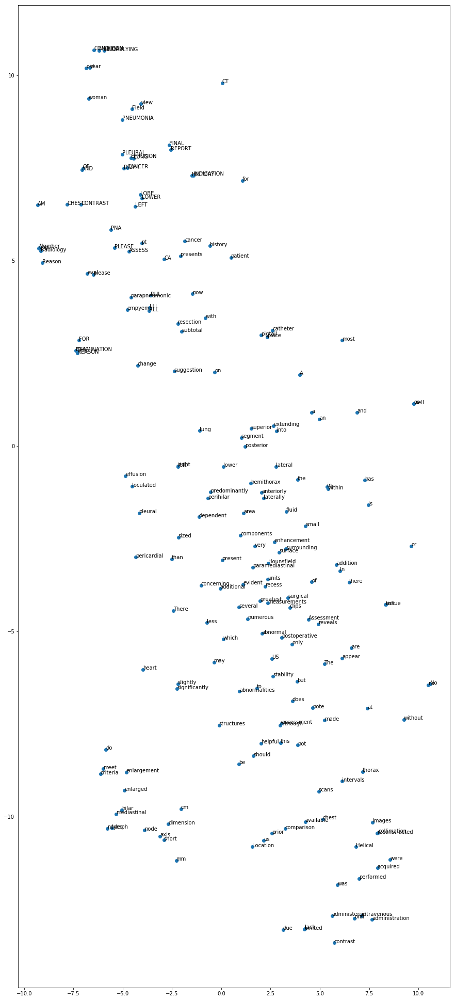

In [17]:
pneumonia_vocab = [k for (k, v) in pneumonia_model.wv.vocab.items()]
plot_embeddings(pneumonia_model, pneumonia_vocab[:200])

#### Visualize Partial Bigram Model

D:\anaconda3\lib\site-packages\ipykernel_launcher.py:9: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  if __name__ == '__main__':


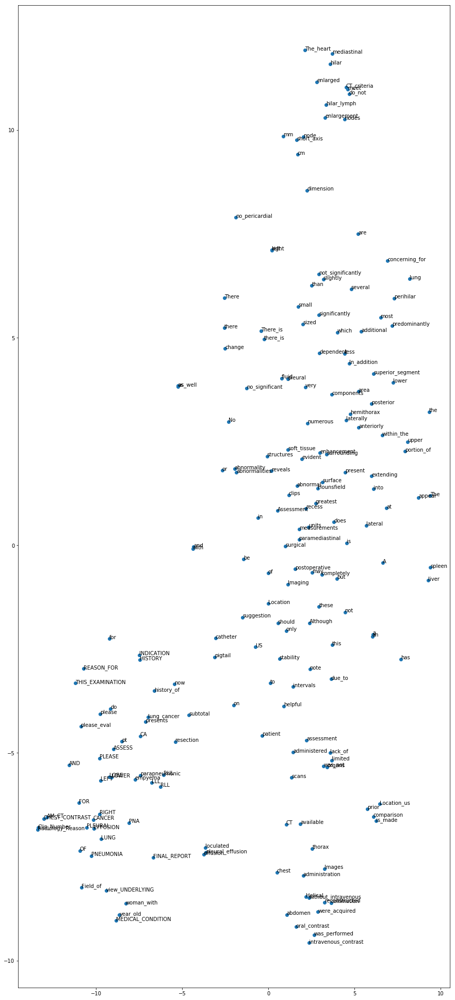

In [18]:
pneumonia_vocab = [k for (k, v) in pneumonia_bigram_model.wv.vocab.items()]
plot_embeddings(pneumonia_bigram_model, pneumonia_vocab[:200])